In [ ]:
## If you have the excel data file in drive than Uncomment it this cell..
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import re
import string
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [ ]:
path = 'path of the excel file'
## You can use the the excel file present in this directory
## path = 'Data_of_mails.xlsx'
load = pd.read_excel(path)
load.head()

## If you are using the another dataset than tune it according to your requirements

,Type,Emails
0,Inquiry,I hope this email finds you well. I am writing...
1,Inquiry,I hope this email finds you doing well. I am w...
2,Inquiry,I hope this email finds you well. I recently r...
3,Inquiry,Inquiry about Renters Insurance - I am current...
4,Inquiry,Inquiry about Life Insurance Policies - I am i...


# ***Data Processing***


In [ ]:
load.tail()

,Type,Emails
4997,Complaint,Unreasonable Billing Deadlines - I am writing ...
4998,Complaint,Lack of Clarity in Billing Statements - I am w...
4999,Complaint,Denied Request for Financial Assistance - I am...
5000,Complaint,Lack of Transparency in Billing Codes - I am w...
5001,Complaint,Unreasonable Delay in Insurance Claim Processi...


In [ ]:
load = load.drop(load.index[[2019,2020]])

In [ ]:
initial_data = load['Emails'].tolist()

In [ ]:
initial_data[0]
print(initial_data)

['I hope this email finds you well. I am writing to inquire about the various insurance policies you offer. I am currently in the market for a new insurance provider and would like to learn more about the coverage and benefits you provide. Could you please send me information on your most popular policies, including details on the types of coverage, premiums, deductibles, and any additional features or discounts available? I am particularly interested in learning more about your home, auto, and life insurance offerings. Additionally, I would appreciate if you could provide me with a comparison of your policies against industry standards, so I can better understand how your offerings stack up. Thank you in advance for your assistance. I look forward to hearing from you and learning more about your insurance solutions.', 'I hope this email finds you doing well. I am writing to inquire about your Policy Type insurance policy. I am currently in the process of reviewing my insurance coverag

In [ ]:
data = [[i]for i in initial_data ]
print(data)
print(len(data))

[['I hope this email finds you well. I am writing to inquire about the various insurance policies you offer. I am currently in the market for a new insurance provider and would like to learn more about the coverage and benefits you provide. Could you please send me information on your most popular policies, including details on the types of coverage, premiums, deductibles, and any additional features or discounts available? I am particularly interested in learning more about your home, auto, and life insurance offerings. Additionally, I would appreciate if you could provide me with a comparison of your policies against industry standards, so I can better understand how your offerings stack up. Thank you in advance for your assistance. I look forward to hearing from you and learning more about your insurance solutions.'], ['I hope this email finds you doing well. I am writing to inquire about your Policy Type insurance policy. I am currently in the process of reviewing my insurance cove

In [ ]:
data[4][0].lower()

'inquiry about life insurance policies - i am in the market for a new life insurance policy and would like to learn more about the options your company offers. could you please provide me with details on your term life, whole life, and universal life policies? i am particularly interested in the coverage amounts, premium costs, and any additional features like accelerated death benefits or living needs benefits. additionally, i would appreciate if you could explain the underwriting process and what factors are considered when determining rates. thank you in advance for your assistance. i look forward to discussing how life insurance can provide financial protection for my family.'

In [ ]:
data_filter = []
issue_indices = []
i=0
for x in data:
  if type(x[0])!=str:
    issue_indices.append(i)
  else:
    data_filter.append(x)
  i=i+1

len(data_filter)
print(issue_indices)

[]


In [ ]:
lower_data = [[i[0].lower()] for i in data_filter]
print(lower_data)

[['i hope this email finds you well. i am writing to inquire about the various insurance policies you offer. i am currently in the market for a new insurance provider and would like to learn more about the coverage and benefits you provide. could you please send me information on your most popular policies, including details on the types of coverage, premiums, deductibles, and any additional features or discounts available? i am particularly interested in learning more about your home, auto, and life insurance offerings. additionally, i would appreciate if you could provide me with a comparison of your policies against industry standards, so i can better understand how your offerings stack up. thank you in advance for your assistance. i look forward to hearing from you and learning more about your insurance solutions.'], ['i hope this email finds you doing well. i am writing to inquire about your policy type insurance policy. i am currently in the process of reviewing my insurance cove

In [ ]:
text = ' '.join(i[0] for i in lower_data)
print(text)

i hope this email finds you well. i am writing to inquire about the various insurance policies you offer. i am currently in the market for a new insurance provider and would like to learn more about the coverage and benefits you provide. could you please send me information on your most popular policies, including details on the types of coverage, premiums, deductibles, and any additional features or discounts available? i am particularly interested in learning more about your home, auto, and life insurance offerings. additionally, i would appreciate if you could provide me with a comparison of your policies against industry standards, so i can better understand how your offerings stack up. thank you in advance for your assistance. i look forward to hearing from you and learning more about your insurance solutions. i hope this email finds you doing well. i am writing to inquire about your policy type insurance policy. i am currently in the process of reviewing my insurance coverage and

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download stopwords
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
removals = f"[{re.escape(string.punctuation)}]"
text_processed = re.sub(removals, ' ', text)

In [ ]:
text_processed

'i hope this email finds you well  i am writing to inquire about the various insurance policies you offer  i am currently in the market for a new insurance provider and would like to learn more about the coverage and benefits you provide  could you please send me information on your most popular policies  including details on the types of coverage  premiums  deductibles  and any additional features or discounts available  i am particularly interested in learning more about your home  auto  and life insurance offerings  additionally  i would appreciate if you could provide me with a comparison of your policies against industry standards  so i can better understand how your offerings stack up  thank you in advance for your assistance  i look forward to hearing from you and learning more about your insurance solutions  i hope this email finds you doing well  i am writing to inquire about your policy type insurance policy  i am currently in the process of reviewing my insurance coverage an

In [ ]:
words = word_tokenize(text_processed)
words
len(words)

425987

In [ ]:
filter_text = " ".join(words)
filter_text

'i hope this email finds you well i am writing to inquire about the various insurance policies you offer i am currently in the market for a new insurance provider and would like to learn more about the coverage and benefits you provide could you please send me information on your most popular policies including details on the types of coverage premiums deductibles and any additional features or discounts available i am particularly interested in learning more about your home auto and life insurance offerings additionally i would appreciate if you could provide me with a comparison of your policies against industry standards so i can better understand how your offerings stack up thank you in advance for your assistance i look forward to hearing from you and learning more about your insurance solutions i hope this email finds you doing well i am writing to inquire about your policy type insurance policy i am currently in the process of reviewing my insurance coverage and would like to le

In [ ]:
stop_words = set(stopwords.words('english'))

In [ ]:

filter_list = [x for x in words if x not in stop_words]
filter_list

['hope',
 'email',
 'finds',
 'well',
 'writing',
 'inquire',
 'various',
 'insurance',
 'policies',
 'offer',
 'currently',
 'market',
 'new',
 'insurance',
 'provider',
 'would',
 'like',
 'learn',
 'coverage',
 'benefits',
 'provide',
 'could',
 'please',
 'send',
 'information',
 'popular',
 'policies',
 'including',
 'details',
 'types',
 'coverage',
 'premiums',
 'deductibles',
 'additional',
 'features',
 'discounts',
 'available',
 'particularly',
 'interested',
 'learning',
 'home',
 'auto',
 'life',
 'insurance',
 'offerings',
 'additionally',
 'would',
 'appreciate',
 'could',
 'provide',
 'comparison',
 'policies',
 'industry',
 'standards',
 'better',
 'understand',
 'offerings',
 'stack',
 'thank',
 'advance',
 'assistance',
 'look',
 'forward',
 'hearing',
 'learning',
 'insurance',
 'solutions',
 'hope',
 'email',
 'finds',
 'well',
 'writing',
 'inquire',
 'policy',
 'type',
 'insurance',
 'policy',
 'currently',
 'process',
 'reviewing',
 'insurance',
 'coverage',
 'w

In [ ]:
final_text = " ".join(filter_list)
final_text

'hope email finds well writing inquire various insurance policies offer currently market new insurance provider would like learn coverage benefits provide could please send information popular policies including details types coverage premiums deductibles additional features discounts available particularly interested learning home auto life insurance offerings additionally would appreciate could provide comparison policies industry standards better understand offerings stack thank advance assistance look forward hearing learning insurance solutions hope email finds well writing inquire policy type insurance policy currently process reviewing insurance coverage would like learn details policy type offering could please provide following information coverage limits deductibles premium rates available discounts exclusions limitations policy eligibility requirements claim filing process timeline payouts additionally would appreciate could share customer reviews testimonials policy type in

In [ ]:
token = Tokenizer()
token.fit_on_texts([final_text])
print(token.word_index)

{'coverage': 1, 'insurance': 2, 'health': 3, 'policy': 4, 'provide': 5, 'please': 6, 'name': 7, 'services': 8, 'regards': 9, 'plan': 10, 'would': 11, 'could': 12, 'details': 13, 'best': 14, 'claim': 15, 'care': 16, 'information': 17, 'renewal': 18, 'process': 19, 'assistance': 20, 'covered': 21, 'options': 22, 'healthcare': 23, 'like': 24, 'want': 25, 'request': 26, 'know': 27, 'medical': 28, 'thank': 29, 'prompt': 30, 'payment': 31, 'need': 32, 'benefits': 33, 'appreciate': 34, 'response': 35, 'financial': 36, 'writing': 37, 'costs': 38, 'including': 39, 'look': 40, 'additional': 41, 'understand': 42, 'additionally': 43, 'review': 44, 'let': 45, 'interested': 46, 'forward': 47, 'billing': 48, 'available': 49, 'therapy': 50, 'decision': 51, 'comprehensive': 52, 'well': 53, 'ensure': 54, 'denied': 55, 'documentation': 56, 'received': 57, 'appreciated': 58, 'requesting': 59, 'limitations': 60, 'hi': 61, 'hello': 62, 'company': 63, 'regarding': 64, 'express': 65, 'resolution': 66, 'necess

In [ ]:
processed_list = []
for i in lower_data:
  mail = re.sub(removals, ' ', i[0])
  mail_token = word_tokenize(mail)
  filter_mail_list = [x for x in mail_token if x not in stop_words]
  final_mail = " ".join(filter_mail_list)
  processed_list.append(final_mail)

In [ ]:
processed_list[0]


'hope email finds well writing inquire various insurance policies offer currently market new insurance provider would like learn coverage benefits provide could please send information popular policies including details types coverage premiums deductibles additional features discounts available particularly interested learning home auto life insurance offerings additionally would appreciate could provide comparison policies industry standards better understand offerings stack thank advance assistance look forward hearing learning insurance solutions'

In [ ]:

tokened_mails = token.texts_to_sequences(processed_list)

In [ ]:
print(tokened_mails)


[[102, 205, 151, 53, 37, 91, 398, 2, 81, 243, 207, 323, 206, 2, 98, 11, 24, 360, 1, 33, 5, 12, 6, 444, 17, 1128, 81, 39, 13, 118, 1, 413, 78, 41, 299, 89, 49, 296, 46, 293, 116, 332, 74, 2, 221, 43, 11, 34, 12, 5, 147, 81, 801, 814, 258, 42, 221, 1113, 29, 111, 20, 40, 47, 470, 293, 2, 596], [102, 205, 151, 53, 37, 91, 4, 159, 2, 4, 207, 19, 110, 2, 1, 11, 24, 360, 13, 4, 159, 637, 12, 6, 5, 474, 17, 1, 140, 78, 84, 200, 49, 89, 251, 60, 4, 270, 76, 15, 290, 19, 232, 958, 43, 11, 34, 12, 92, 130, 454, 194, 4, 159, 2, 11, 75, 258, 42, 272, 363, 477, 130, 628, 29, 111, 108, 20, 40, 47, 35, 748, 1646, 4, 159, 2, 4, 534], [102, 205, 151, 53, 163, 57, 17, 227, 4, 159, 2, 4, 41, 88, 11, 34, 12, 174, 275, 11, 24, 258, 42, 474, 185, 431, 1, 115, 774, 15, 290, 19, 34, 180, 108, 174, 13, 75, 99, 188, 51, 260, 4, 159, 2, 4, 164, 462, 127, 29, 20, 40, 47, 35], [137, 405, 2, 207, 793, 1071, 46, 293, 405, 2, 81, 12, 6, 5, 13, 1, 22, 246, 413, 78, 152, 405, 2, 11, 97, 24, 27, 89, 49, 567, 24, 535, 60

# ***Target Feature Processing***

In [ ]:
target = load['Type']
target_list = target.tolist()
len(target_list)

5000

# **Padding**

In [ ]:
lengths = [len(i) for i in tokened_mails]
print(lengths)
maxsize =  max(lengths)
print(maxsize)

[67, 78, 54, 63, 64, 59, 62, 69, 69, 61, 68, 65, 60, 64, 64, 61, 68, 65, 60, 64, 64, 63, 65, 61, 68, 65, 60, 64, 64, 64, 66, 61, 69, 66, 60, 64, 65, 64, 65, 62, 68, 66, 61, 64, 66, 64, 66, 62, 69, 67, 62, 65, 67, 65, 67, 62, 70, 67, 63, 66, 67, 66, 68, 62, 69, 67, 62, 65, 67, 65, 68, 62, 70, 67, 63, 66, 67, 66, 68, 62, 70, 68, 63, 66, 67, 66, 68, 57, 50, 55, 49, 50, 56, 50, 49, 52, 57, 49, 54, 56, 48, 56, 69, 67, 61, 64, 66, 65, 56, 50, 53, 48, 54, 57, 48, 57, 51, 54, 49, 55, 58, 49, 38, 37, 44, 39, 38, 37, 28, 29, 27, 26, 30, 25, 29, 27, 27, 27, 48, 49, 54, 48, 54, 57, 49, 27, 26, 25, 26, 24, 26, 25, 24, 23, 52, 53, 54, 49, 53, 56, 49, 52, 53, 54, 49, 53, 56, 49, 24, 27, 25, 22, 24, 23, 25, 24, 25, 23, 28, 24, 51, 53, 54, 48, 54, 57, 49, 23, 28, 25, 22, 25, 23, 26, 27, 22, 24, 27, 26, 49, 50, 54, 48, 54, 57, 49, 27, 26, 26, 24, 24, 23, 22, 24, 25, 24, 25, 24, 51, 50, 54, 48, 54, 57, 49, 50, 50, 54, 48, 54, 57, 49, 51, 50, 54, 48, 54, 57, 49, 57, 70, 68, 62, 65, 67, 66, 58, 71, 68, 63,

In [ ]:
padded_list = pad_sequences(tokened_mails, maxlen=maxsize, padding='post')
print(padded_list)

[[102 205 151 ...   0   0   0]
 [102 205 151 ...   0   0   0]
 [102 205 151 ...   0   0   0]
 ...
 [ 55  26  36 ...   0   0   0]
 [ 69 208  48 ...   0   0   0]
 [177 257   2 ...   0   0   0]]


In [ ]:
target_list1 = target_list
print(target_list1)

['Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry', 'Inquiry'

In [ ]:
num_classes = len(set(target_list1))
num_classes

5

In [ ]:
from pandas import get_dummies

In [ ]:
final_target_list = get_dummies(target_list1)
print(final_target_list)
print(type(final_target_list))

      Claim  Complaint  Inquiry  Query  Renewal
0     False      False     True  False    False
1     False      False     True  False    False
2     False      False     True  False    False
3     False      False     True  False    False
4     False      False     True  False    False
...     ...        ...      ...    ...      ...
4995  False       True    False  False    False
4996  False       True    False  False    False
4997  False       True    False  False    False
4998  False       True    False  False    False
4999  False       True    False  False    False

[5000 rows x 5 columns]
<class 'pandas.core.frame.DataFrame'>


# ***Data Splitting***

In [ ]:
X_train, X_temp, Y_train, Y_temp = train_test_split(padded_list, final_target_list, test_size=0.35, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)


In [ ]:
print(X_train)
print(X_train.shape)
type(X_train)

[[ 52 190   2 ...   0   0   0]
 [369 216 244 ...   0   0   0]
 [222 277  85 ...   0   0   0]
 ...
 [ 18 453 137 ...   0   0   0]
 [276   2  18 ...   0   0   0]
 [222   3   2 ...   0   0   0]]
(3250, 97)


numpy.ndarray

In [ ]:
print(Y_train)
print(Y_train.shape)

      Claim  Complaint  Inquiry  Query  Renewal
3976  False      False    False  False     True
4584  False       True    False  False    False
420   False      False     True  False    False
3422  False      False    False  False     True
6     False      False     True  False    False
...     ...        ...      ...    ...      ...
4426  False       True    False  False    False
466   False      False     True  False    False
3092  False      False    False  False     True
3772  False      False    False  False     True
860   False      False     True  False    False

[3250 rows x 5 columns]
(3250, 5)


In [ ]:
print(X_val)
print(X_val.shape)

[[128  55   1 ...   0   0   0]
 [ 32  83   3 ...   0   0   0]
 [ 18 195 198 ...   0   0   0]
 ...
 [137  18   1 ...   0   0   0]
 [ 26  72 326 ...   0   0   0]
 [247 165  16 ...   0   0   0]]
(875, 97)


In [ ]:
print(Y_val)
print(Y_val.shape)

      Claim  Complaint  Inquiry  Query  Renewal
2653   True      False    False  False    False
589   False      False     True  False    False
3625  False      False    False  False     True
4958  False       True    False  False    False
3732  False      False    False  False     True
...     ...        ...      ...    ...      ...
2900   True      False    False  False    False
4239  False       True    False  False    False
3288  False      False    False  False     True
2409   True      False    False  False    False
3959  False      False    False  False     True

[875 rows x 5 columns]
(875, 5)


In [ ]:
print(X_test)
print(X_test.shape)

[[ 18   4 198 ...   0   0   0]
 [136 229  55 ...   0   0   0]
 [ 55 352 375 ...   0   0   0]
 ...
 [311 403   2 ...   0   0   0]
 [177  31 708 ...   0   0   0]
 [  3   2 137 ...   0   0   0]]
(875, 97)


In [ ]:
print(Y_test)
print(Y_test.shape)


      Claim  Complaint  Inquiry  Query  Renewal
3168  False      False    False  False     True
2525   True      False    False  False    False
4264  False       True    False  False    False
218   False      False     True  False    False
1966  False      False    False   True    False
...     ...        ...      ...    ...      ...
2127   True      False    False  False    False
3007  False      False    False  False     True
3729  False      False    False  False     True
4541  False       True    False  False    False
596   False      False     True  False    False

[875 rows x 5 columns]
(875, 5)


In [ ]:
all_index = Y_test.index.tolist()
print(all_index)

[3168, 2525, 4264, 218, 1966, 665, 3988, 3036, 4697, 1228, 2284, 4812, 2251, 1207, 4696, 530, 3601, 109, 2633, 2465, 1338, 3575, 4273, 2292, 2330, 2998, 2264, 3286, 229, 3615, 3653, 2298, 1864, 3620, 4895, 693, 486, 4321, 3493, 3405, 445, 2174, 1417, 1907, 1090, 4072, 2121, 4328, 2275, 1407, 4450, 4180, 4346, 4534, 1151, 3437, 429, 4118, 2879, 2366, 642, 4870, 3066, 1253, 4176, 4687, 4793, 1557, 416, 746, 4444, 3516, 367, 4144, 3214, 2318, 3277, 2088, 3142, 138, 4918, 192, 56, 1425, 1832, 3438, 3903, 598, 4721, 2372, 3039, 4975, 4254, 2486, 2945, 564, 3253, 691, 2827, 1041, 3504, 2775, 1808, 2559, 4892, 4877, 4062, 3109, 4581, 2470, 2002, 2223, 4108, 461, 1181, 1270, 3129, 3407, 3705, 3159, 2107, 2659, 305, 1509, 1872, 3885, 1946, 1361, 443, 4376, 1293, 1626, 2092, 442, 557, 2527, 829, 1894, 296, 4724, 1543, 3617, 1480, 4310, 3040, 2644, 538, 4368, 1351, 3921, 711, 2787, 1397, 1954, 3011, 1945, 2572, 3098, 1962, 220, 650, 4111, 4148, 4327, 79, 233, 328, 3785, 366, 3008, 2526, 3326, 115

In [ ]:
Y_test_orignal = [target_list1[i] for i in all_index]
Y_test_orignal

['Renewal',
 'Claim',
 'Complaint',
 'Inquiry',
 'Query',
 'Inquiry',
 'Renewal',
 'Renewal',
 'Complaint',
 'Query',
 'Claim',
 'Complaint',
 'Claim',
 'Query',
 'Complaint',
 'Inquiry',
 'Renewal',
 'Inquiry',
 'Claim',
 'Claim',
 'Query',
 'Renewal',
 'Complaint',
 'Claim',
 'Claim',
 'Claim',
 'Claim',
 'Renewal',
 'Inquiry',
 'Renewal',
 'Renewal',
 'Claim',
 'Query',
 'Renewal',
 'Complaint',
 'Inquiry',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Renewal',
 'Inquiry',
 'Claim',
 'Query',
 'Query',
 'Query',
 'Complaint',
 'Claim',
 'Complaint',
 'Claim',
 'Query',
 'Complaint',
 'Complaint',
 'Complaint',
 'Complaint',
 'Query',
 'Renewal',
 'Inquiry',
 'Complaint',
 'Claim',
 'Claim',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Query',
 'Complaint',
 'Complaint',
 'Complaint',
 'Query',
 'Inquiry',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Claim',
 'Renewal',
 'Claim',
 'Renewal',
 'Inquiry',
 'Complaint',
 'Inquiry',
 'Inquiry',
 'Query',
 'Query',


# ***Model***

In [ ]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Embedding, LSTM, Dense,Masking

In [ ]:
model1 = Sequential()

In [ ]:
#model.add(Masking(mask_value=0.0, input_shape=(None,maxsize)))
model1.add(Embedding(input_dim=len(token.word_index)+1, output_dim=200, input_length=maxsize,mask_zero=True))
model1.add(LSTM(units=200))
model1.add(Dense(units=5, activation='softmax'))

In [ ]:
model1.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

In [ ]:
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 97, 200)           523200    
                                                                 
 lstm (LSTM)                 (None, 200)               320800    
                                                                 
 dense (Dense)               (None, 5)                 1005      
                                                                 
Total params: 845005 (3.22 MB)
Trainable params: 845005 (3.22 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model1.fit(X_train,Y_train,validation_data =(X_val,Y_val),batch_size=32,epochs=50)

Epoch 1/50
102/102 [==============================] - 24s 167ms/step - loss: 0.5435 - accuracy: 0.8298 - val_loss: 0.2343 - val_accuracy: 0.9383
Epoch 2/50
102/102 [==============================] - 10s 97ms/step - loss: 0.0406 - accuracy: 0.9917 - val_loss: 0.0196 - val_accuracy: 0.9931
Epoch 3/50
102/102 [==============================] - 5s 46ms/step - loss: 0.0133 - accuracy: 0.9969 - val_loss: 0.0647 - val_accuracy: 0.9840
Epoch 4/50
102/102 [==============================] - 3s 26ms/step - loss: 0.0268 - accuracy: 0.9945 - val_loss: 0.0227 - val_accuracy: 0.9966
Epoch 5/50
102/102 [==============================] - 4s 38ms/step - loss: 0.0297 - accuracy: 0.9935 - val_loss: 0.0313 - val_accuracy: 0.9897
Epoch 6/50
102/102 [==============================] - 3s 25ms/step - loss: 0.0164 - accuracy: 0.9960 - val_loss: 0.0315 - val_accuracy: 0.9920
Epoch 7/50
102/102 [==============================] - 3s 27ms/step - loss: 0.0018 - accuracy: 0.9997 - val_loss: 0.0249 - val_accuracy: 0.9

In [ ]:
## save the model in your required format like .h5, .keras or .tf
model1.save("Email_Bifuraction_model_fixed.h5")

# **Testing and visualising **

In [ ]:
Y_pred = model1.predict(X_test)

28/28 [==============================] - 2s 5ms/step


In [ ]:
print(Y_pred)

[[5.3342690e-09 1.4566004e-06 1.7091112e-06 5.4658835e-07 9.9999630e-01]
 [9.9999881e-01 5.9412611e-07 1.9854761e-07 2.5845901e-07 1.7239344e-07]
 [7.5828024e-07 9.9999511e-01 1.1383905e-06 1.9257446e-07 2.9009254e-06]
 ...
 [4.7690927e-09 1.8011882e-06 1.3000138e-06 5.6367003e-07 9.9999630e-01]
 [3.2847274e-07 9.9999714e-01 5.5289053e-07 9.2280423e-08 1.8905058e-06]
 [5.0196693e-08 3.0326618e-08 9.9999917e-01 2.4832298e-08 7.2205967e-07]]


In [ ]:
def getVariableByValue(input_value):
    dictionary = ["Claim",  "Complaint", "Inquiry",  "Query",  "Renewal"]
    return dictionary[input_value]


In [ ]:
Prediction = [getVariableByValue(list(Y_pred[i]).index(max(Y_pred[i]))) for i in range(len(Y_pred))]
Prediction

['Renewal',
 'Claim',
 'Complaint',
 'Inquiry',
 'Query',
 'Inquiry',
 'Renewal',
 'Renewal',
 'Complaint',
 'Query',
 'Claim',
 'Complaint',
 'Claim',
 'Query',
 'Complaint',
 'Inquiry',
 'Renewal',
 'Inquiry',
 'Claim',
 'Claim',
 'Query',
 'Renewal',
 'Complaint',
 'Claim',
 'Claim',
 'Claim',
 'Claim',
 'Renewal',
 'Inquiry',
 'Renewal',
 'Renewal',
 'Claim',
 'Query',
 'Renewal',
 'Complaint',
 'Inquiry',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Renewal',
 'Inquiry',
 'Claim',
 'Query',
 'Query',
 'Query',
 'Complaint',
 'Claim',
 'Complaint',
 'Claim',
 'Query',
 'Complaint',
 'Complaint',
 'Complaint',
 'Complaint',
 'Query',
 'Renewal',
 'Inquiry',
 'Complaint',
 'Claim',
 'Claim',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Query',
 'Complaint',
 'Complaint',
 'Complaint',
 'Query',
 'Inquiry',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Inquiry',
 'Complaint',
 'Renewal',
 'Claim',
 'Renewal',
 'Claim',
 'Renewal',
 'Inquiry',
 'Complaint',
 'Inquiry',
 'Inquiry',
 'Query',
 'Query',


In [ ]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(Y_test_orignal, Prediction)
print("Accuracy:", accuracy)

Accuracy: 0.9965714285714286


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

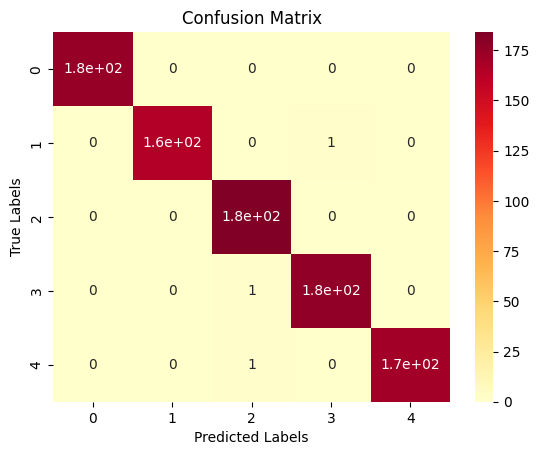

In [ ]:
cm = confusion_matrix(Y_test_orignal, Prediction)
sns.heatmap(cm, annot=True, cmap="YlOrRd")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# ***Model Loading and pridicting for any custom mail***

In [ ]:
## You may also directly use variable model1
saved_model = load_model("path to your model")

In [ ]:
text_test = "Query regarding the renewal of my insurance policy - I hope that this email finds you well. My insura Thank you!!.he new policies and their T&C's in order to renew my policy"

In [ ]:
predict_proccessed =  re.sub(removals, ' ',text_test)
predict_proccessed

'Query regarding the renewal of my insurance policy   I hope that this email finds you well  My insura Thank you   he new policies and their T C s in order to renew my policy'

In [ ]:
text_tokenized = word_tokenize(predict_proccessed)
text_tokenized


['Query',
 'regarding',
 'the',
 'renewal',
 'of',
 'my',
 'insurance',
 'policy',
 'I',
 'hope',
 'that',
 'this',
 'email',
 'finds',
 'you',
 'well',
 'My',
 'insura',
 'Thank',
 'you',
 'he',
 'new',
 'policies',
 'and',
 'their',
 'T',
 'C',
 's',
 'in',
 'order',
 'to',
 'renew',
 'my',
 'policy']

In [ ]:
filter_test_txt = [x for x in text_tokenized if x not in stop_words]
final_test_txt = ' '.join(x for x in filter_test_txt)
final_test_txt

'Query regarding renewal insurance policy I hope email finds well My insura Thank new policies T C order renew policy'

In [ ]:
tokened_final = token.texts_to_sequences([final_test_txt])
tokened_final

[[123, 64, 18, 2, 4, 102, 205, 151, 53, 29, 206, 81, 145, 4]]

In [ ]:
padded_final = pad_sequences(tokened_final, maxlen=maxsize, padding='post')
padded_final

array([[123,  64,  18,   2,   4, 102, 205, 151,  53,  29, 206,  81, 145,
          4,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0]], dtype=int32)

In [ ]:
pred = saved_model.predict(padded_final)
print(pred)
result = getVariableByValue(list(pred[0]).index(max(pred[0])))
print(result)

1/1 [==============================] - 3s 3s/step
[[0.01238304 0.01972315 0.7859816  0.10742504 0.0744872 ]]
Inquiry


In [ ]:
## Run this script only if you have saved the model in .tf format

import os
import shutil
from google.colab import files

# Define the model folder path
model_folder = "/content/Email_Bifuraction_model_fixed.tf"

# Step 1: Check the contents of the folder
print(os.listdir(model_folder))

# Step 2: Zip the model folder
shutil.make_archive('/content/Email_Bifuraction_model_fixed.tf', 'zip', '/content', 'Email_Bifuraction_model_fixed.tf')

# Step 3: Download the zip file
files.download('/content/Email_Bifuraction_model_fixed.tf.zip')


['keras_metadata.pb', 'saved_model.pb', 'fingerprint.pb', 'variables', 'assets']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>